# A Study on Bike Rentals in Seoul


### Introduction
In this study on bike rentals in Seoul, our aim is to delve into data wrangling, processing and visualization. We want to develop skills of tidying up our data and and modifying it to suit the tasks at hand. Also, we seek to improve our visualization design skills by exploring various types of visualizations to identify the one that best fits our objectives.


### Audience
Our primary audience comprises young to middle-aged citizens of Seoul, as it is predominantly these age groups that engage in bike rentals within the city. They may be interested in understanding the availability of bikes for rent under various circumstances. Another potential audience is the bike rental companies who may want to ascertain the rush hours for bike rentals to better manage their inventory and staff schedules.

### Motivation
Citizens may wish to avoid rush hours or reserve bikes beforehand to ensure availability. On the other hand, rental companies might want to identify rush hours to better prepare for the increased demand. Hence, our audience can utilize the visualizations to understand the rental trends based on different conditions (such as weather and temperature) and plan their actions accordingly.


# Task Analysis

Initially, the visualization platform should feature two main tabs: "Overview" and "Trending", with four sub-tabs under each main tab corresponding to the four seasons.

In the "Overview" tab, the visualization should display the total number of bike rentals per day, encoded on the y-axis (computed as a derived value). An area plot will depict the distribution of rental numbers throughout the year, with the data encoded on the x-axis (Characterize Distribution). A tooltip for each day should display the date, total number of rentals, and whether the day falls on a weekend or a holiday. Clicking on a specific day should reveal a detailed distribution of rental numbers for each hour of that day.

For the "Trending" tab, the focus will be on analyzing the trend of rental numbers across different temperatures and times of the day. This section should further be divided into four subsets, one for each season, to provide a nuanced analysis of rental trends.

These structured visualizations aim to provide a comprehensive insight into bike rental trends in Seoul, catering to the needs of both the citizens and rental companies, thereby aiding in making informed decisions.


# Preliminary Exploratory Analysis
#### Loading the required libraries, reading the CSV file, modifying data and previewing the data frame.

In [1]:
import pandas as pd
import altair as alt

# Read the dataset
url = 'https://raw.githubusercontent.com/yuwangy/Seoul_bike_rental_viz/main/SeoulBikeData.csv'
data = pd.read_csv(url, encoding='latin-1')
data.head()

# Add 'Month' as ordinal attribute
data['Date'] = pd.to_datetime(data['Date'], format='%d/%m/%Y')

# Create 'Month' column based on date
data['Month'] = data['Date'].dt.month

# Add 'Weekend' as nominal attribute, determine if the date is on a weekend 
data['Weekend'] = data['Date'].dt.dayofweek.apply(lambda x: 'Yes' if x >= 5 else 'No')

data.head(10)



,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Weekend
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
5,2017-12-01,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
6,2017-12-01,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
7,2017-12-01,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
8,2017-12-01,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes,12,No
9,2017-12-01,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes,12,No


# Data Abstraction
#### Printing out the semantics, the data attribute type, the cardinality for each attribute.

In [2]:
# Create data abstraction for Seoul Bike Rental Dataset in the form of csv table

url = 'https://raw.githubusercontent.com/yuwangy/Seoul_bike_rental_viz/main/Seoul%20Bike%20Rental%20Data%20Abstraction.csv'
data_abstraction = pd.read_csv(url)
data_abstraction



,Unnamed: 0,Semantics,Attribute Type,Cardinality
0,Date,The specific day of the month of the year,Temporal,01-12-2017 to 30-11-2018
1,Rented Bike Count,The specific number of bikes rented in given hour,Quantitative,0 - 3556 bikes rented
2,Hour,The specific hour of the day ...,Ordinal,24
3,Temperature (°C),The temperature in given hour,Quantitative,-17.8 - 39.4 °C
4,Humidity (%),The humidity in given hour,Quantitative,0 - 98 % humidity
5,Wind speed (m/s),The wind speed in given hour,Quantitative,0 - 7.4 m/s wind speed
6,Visibility (10m),The visibility (how far you can see clearly) i...,Quantitative,27 - 2000 (10m) visibility
7,Dew point temperature (°C),The dew point temperature in given hour,Quantitative,-30.6 - 27.2 °C dew point temperature
8,Solar Radiation (MJ/m2),The amount of solar radiation in given hour,Quantitative,0 - 3.52 (MJ/m2)
9,Rainfall (mm),The amount of rain in given hour,Quantitative,0 - 35 (mm)


# Exploratory Data Analysis
#### Printing out size of data, names of columns, etc.

In [3]:
# EDA for the rental bike dataset

# Print the shape
print(data.shape)

# Print the info
print(data.info())

# Print the names of the columns
print(data.columns)



(8760, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        


#### Printing out extreme values on numerical attributes.

In [4]:
# Obtaining the extreme quantitative values in the data 

# Extract maximum and minimum Rented Bike Count
max_rented_bike_count = data['Rented Bike Count'].max()
print(f'maximum bikes rented: {max_rented_bike_count}')
min_rented_bike_count = data['Rented Bike Count'].min()
print(f'minimum bikes rented: {min_rented_bike_count}')

# Extract highest and lowest temperature
highest_temperature = data['Temperature(°C)'].max()
print(f'highest temperature: {highest_temperature}')
lowest_temperature = data['Temperature(°C)'].min()
print(f'lowest temperature: {lowest_temperature}')

# Extract highest and lowest humidity
highest_humidity = data['Humidity(%)'].max()
print(f'highest humidity: {highest_humidity}')
lowest_humidity = data['Humidity(%)'].min()
print(f'lowest humidit: {lowest_humidity}')

# Extract maximum and minimum wind speed
max_wind_speed = data['Wind speed (m/s)'].max()
print(f'maximum wind speed: {max_wind_speed}')
min_wind_speed = data['Wind speed (m/s)'].min()
print(f'minimum wind speed: {min_wind_speed}')

# Extract maximum and minimum visibility
max_visibility = data['Visibility (10m)'].max()
print(f'maximum visibility: {max_visibility}')
min_visibility = data['Visibility (10m)'].min()
print(f'minimum visibility: {min_visibility}')

# Extract highest and lowest dew point temperature
highest_dew_point_temperature = data['Dew point temperature(°C)'].max()
print(f'highest dew point temperature: {highest_dew_point_temperature}')
lowest_dew_point_temperature = data['Dew point temperature(°C)'].min()
print(f'lowest dew point temperature: {lowest_dew_point_temperature}')

# Extract maximum and minimum solar radiation
max_solar_radiation = data['Solar Radiation (MJ/m2)'].max()
print(f'maximum solar radiation: {max_solar_radiation}')
min_solar_radiation = data['Solar Radiation (MJ/m2)'].min()
print(f'minimum solar radiation: {min_solar_radiation}')

# Extract maximum and minimum rainfall
max_rainfall = data['Rainfall(mm)'].max()
print(f'maximum rainfall: {max_rainfall}')
min_rainfall = data['Rainfall(mm)'].min()
print(f'minimum rainfall: {min_rainfall}')

# Extract maximum and minimum snowfall
max_snowfall = data['Snowfall (cm)'].max()
print(f'maximum snowfall: {max_snowfall}')
min_snowfall = data['Snowfall (cm)'].min()
print(f'minimum snowfall: {min_snowfall}')



maximum bikes rented: 3556
minimum bikes rented: 0
highest temperature: 39.4
lowest temperature: -17.8
highest humidity: 98
lowest humidit: 0
maximum wind speed: 7.4
minimum wind speed: 0.0
maximum visibility: 2000
minimum visibility: 27
highest dew point temperature: 27.2
lowest dew point temperature: -30.6
maximum solar radiation: 3.52
minimum solar radiation: 0.0
maximum rainfall: 35.0
minimum rainfall: 0.0
maximum snowfall: 8.8
minimum snowfall: 0.0


# Numerical Summaries for all attributes
#### Conducting central tendency measures, creating frequency table.

In [5]:
# Statistical summaries for numerical attributes (central tendency measures)

data.describe()


,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,2018-05-31 23:59:59.999999744,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,6.526027
min,2017-12-01 00:00:00,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,1.000000
25%,2018-03-02 00:00:00,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,4.000000
50%,2018-06-01 00:00:00,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,7.000000
75%,2018-08-31 00:00:00,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,10.000000
max,2018-11-30 00:00:00,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,12.000000
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048


In [6]:
# Obtain frequency table of all attributes

print(data['Date'].value_counts())
print(data['Rented Bike Count'].value_counts())
print(data['Hour'].value_counts())
print(data['Temperature(°C)'].value_counts())
print(data['Humidity(%)'].value_counts())
print(data['Wind speed (m/s)'].value_counts())
print(data['Visibility (10m)'].value_counts())
print(data['Dew point temperature(°C)'].value_counts())
print(data['Solar Radiation (MJ/m2)'].value_counts())
print(data['Rainfall(mm)'].value_counts())
print(data['Snowfall (cm)'].value_counts())
print(data['Seasons'].value_counts())
print(data['Holiday'].value_counts())
print(data['Functioning Day'].value_counts())
print(data['Month'].value_counts())
print(data['Weekend'].value_counts())



Date
2018-11-30    24
2017-12-01    24
2017-12-02    24
2017-12-03    24
2017-12-04    24
              ..
2017-12-17    24
2017-12-18    24
2017-12-19    24
2017-12-20    24
2017-12-21    24
Name: count, Length: 365, dtype: int64
Rented Bike Count
0       295
122      19
223      19
262      19
189      18
       ... 
2159      1
1692      1
894       1
793       1
1304      1
Name: count, Length: 2166, dtype: int64
Hour
0     365
1     365
2     365
3     365
4     365
5     365
6     365
7     365
8     365
9     365
10    365
11    365
12    365
13    365
14    365
15    365
16    365
17    365
18    365
19    365
20    365
21    365
22    365
23    365
Name: count, dtype: int64
Temperature(°C)
 19.1    40
 20.5    40
 23.4    39
 20.7    38
 7.6     38
         ..
-17.4     1
-13.5     1
-13.6     1
-13.9     1
 36.9     1
Name: count, Length: 546, dtype: int64
Humidity(%)
97    173
53    173
43    164
57    159
56    157
     ... 
19     11
13      3
12      1
10      1
11      1

# Data Visualization and Design
#### Creating visual summaries, including univariate and multi-variate.

In [38]:
# Activate the VegaFusion data transformer
import altair as alt
alt.data_transformers.enable("vegafusion")


# Histograms for various attributes
hist_bike_count = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Rented Bike Count:Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Rented Bike Count:Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Rented Bike Count',
).interactive()

display(hist_bike_count)



hist_temperature = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Temperature(°C):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Temperature(°C):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Temperature(°C)',
).interactive()

display(hist_temperature)



hist_humidity = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Humidity(%):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Humidity(%):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Humidity(%)',
).interactive()

display(hist_humidity)



hist_windspeed = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Wind speed (m/s):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Wind speed (m/s):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Wind speed (m/s)',
).interactive()

display(hist_windspeed)



hist_visibility = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Visibility (10m):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Visibility (10m):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Visibility (10m)',
).interactive()

display(hist_visibility)



hist_solar_radiation = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Solar Radiation (MJ/m2):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Solar Radiation (MJ/m2):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Solar Radiation (MJ/m2)',
).interactive()

display(hist_solar_radiation)



hist_rainfall = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Rainfall(mm):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Rainfall(mm):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Rainfall(mm)',
).interactive()

display(hist_rainfall)



hist_snowfall = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Snowfall (cm):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Snowfall (cm):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Snowfall (cm)',
).interactive()

display(hist_snowfall)



alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

#### Multi-Variate Visual Summaries.

In [66]:
# Create simple visual summaries, bar charts, line charts, boxplot charts etc

# Boxplot to identify outliers in Hourly Rented Bike Count
bikecount_boxplot_chart = alt.Chart(data).mark_boxplot().encode(
    alt.X('Hour:O'),
    alt.Y('Rented Bike Count:Q', title = 'Hourly Rented Bike Count'),
).properties(
    width = 500,
    height = 300,
    title = 'Boxplot chart for Hourly Rented Bike Count',
)

display(bikecount_boxplot_chart)



# The sum of Rented Bike Count across various hours of day
bikecount_barchart = alt.Chart(data).mark_bar().encode(
    alt.X('Hour:O', sort = '-y'),
    alt.Y('sum(Rented Bike Count):Q'),
    alt.Color('Seasons:N'),
    alt.Tooltip('Date'),
).properties(
    width = 500,
    height = 350,
    title = 'Stacked Barchart for Hourly Sum Rented Bike Count',
)

display(bikecount_barchart)



# Sum values of Rented Bike Count across 4 seasons of year
seasons_bikecount_barchart = alt.Chart(data).mark_bar().encode(
    alt.Y('Seasons:N', sort = 'x'),
    alt.X('sum(Rented Bike Count):Q'),
    alt.Color('Month:O'),
    alt.Tooltip('sum(Rented Bike Count):Q'),
).properties(
    width = 500,
    height = 150,
    title = 'Barchart for Season Sum Rented Bike Count',
)

display(seasons_bikecount_barchart)



# Density plot for Rented Bike Count
bikecount_density_chart = alt.Chart(data).mark_area().encode(
    x='Rented Bike Count:Q',
    y='density:Q',
).transform_density(
    'Rented Bike Count',
    as_=['Rented Bike Count', 'density'],
).properties(
    width = 500,
    height = 300,
    title = 'Density plot for Rented Bike Count',
)

display(bikecount_density_chart)



# Heatmap for Rented Bike Count by Hour & Month
bikecount_heatmap = alt.Chart(data).mark_rect().encode(
    alt.Y('Month:O'),
    alt.X('Hour:O'),
    alt.Color('Rented Bike Count:Q'),
    alt.Tooltip('Date'),
).properties(
    width = 500,
    height = 250,
    title = 'Heatmap for Rented Bike Count by Hour & Month',
)

display(bikecount_heatmap)




alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

#### Concatenating charts for comparison.

In [70]:
# Concatenating charts for comparison, analyzing scale of influence factors

# Line chart for Rented Bike Count by temperature
bikecount_temperature_linechart = alt.Chart(data).mark_line(point = True).encode(
    alt.X('Temperature(°C):Q', bin = alt.Bin(maxbins = 30)),
    alt.Y('mean(Rented Bike Count):Q'),
    alt.Color('Seasons:N'),
    alt.Tooltip('mean(Rented Bike Count):Q'),
).properties(
    width = 500,
    height = 300,
    title = 'Linechart for Mean Rented Bike Count by Temperature',
)

# display(bikecount_temperature_linechart)

# Line chart for Rented Bike Count by humidity
bikecount_humidity_linechart = alt.Chart(data).mark_line(point = True).encode(
    alt.X('Humidity(%):Q', bin = alt.Bin(maxbins = 30)),
    alt.Y('mean(Rented Bike Count):Q'),
    alt.Color('Seasons:N'),
    alt.Tooltip('mean(Rented Bike Count):Q'),
).properties(
    width = 500,
    height = 300,
    title = 'Linechart for Mean Rented Bike Count by Humidity',
)

# display(bikecount_humidity_linechart)

# concatenating two line charts horizontally
side_by_side_linecharts = alt.hconcat(bikecount_temperature_linechart, bikecount_humidity_linechart)
display(side_by_side_linecharts)





# Scatter plot for Rainfall vs. Rented Bike Count
bikecount_rainfall_scatter = alt.Chart(data).mark_circle(size = 50).encode(
    alt.X('Rainfall(mm)'),
    alt.Y('Rented Bike Count'),
    alt.Tooltip('Rented Bike Count'),
).properties(
    width = 500,
    height = 350,
    title = 'Scatter plot for Rainfall & Rented Bike Count',
)

# display(bikecount_rainfall_scatter)

# Scatter plot for Snowfall vs. Rented Bike Count
bikecount_snowfall_scatter = alt.Chart(data).mark_circle(size = 50).encode(
    alt.X('Snowfall (cm)'),
    alt.Y('Rented Bike Count'),
    alt.Tooltip('Rented Bike Count'),
).properties(
    width = 500,
    height = 350,
    title = 'Scatter plot for Snowfall & Rented Bike Count',
)

# display(bikecount_snowfall_scatter)

# concatenating two scatter plots horizontally
side_by_side_scattercharts = alt.hconcat(bikecount_rainfall_scatter, bikecount_snowfall_scatter)
display(side_by_side_scattercharts)






# # Scatter matrix chart for Rented Bike Count
# bikecount_scatter_matrix = alt.Chart(data).mark_circle(size = 50).encode(
#     alt.X(alt.repeat("column"), type='quantitative'),
#     alt.Y(alt.repeat("row"), type='quantitative'),
# ).properties(
#     width = 100,
#     height = 100,
#     title = 'Scatter matrix plot for Rented Bike Count by rainfall & snowfall',
# ).repeat(
#     row=['Rainfall(mm)', 'Snowfall (cm)', 'sum(Rented Bike Count)'],
#     column=['Rainfall(mm)', 'Snowfall (cm)', 'sum(Rented Bike Count)'],
# )

# display(bikecount_scatter_matrix)




alt.HConcatChart(...)

alt.HConcatChart(...)

## Part 3 - Visualization Ideas
### Preliminary Sketches

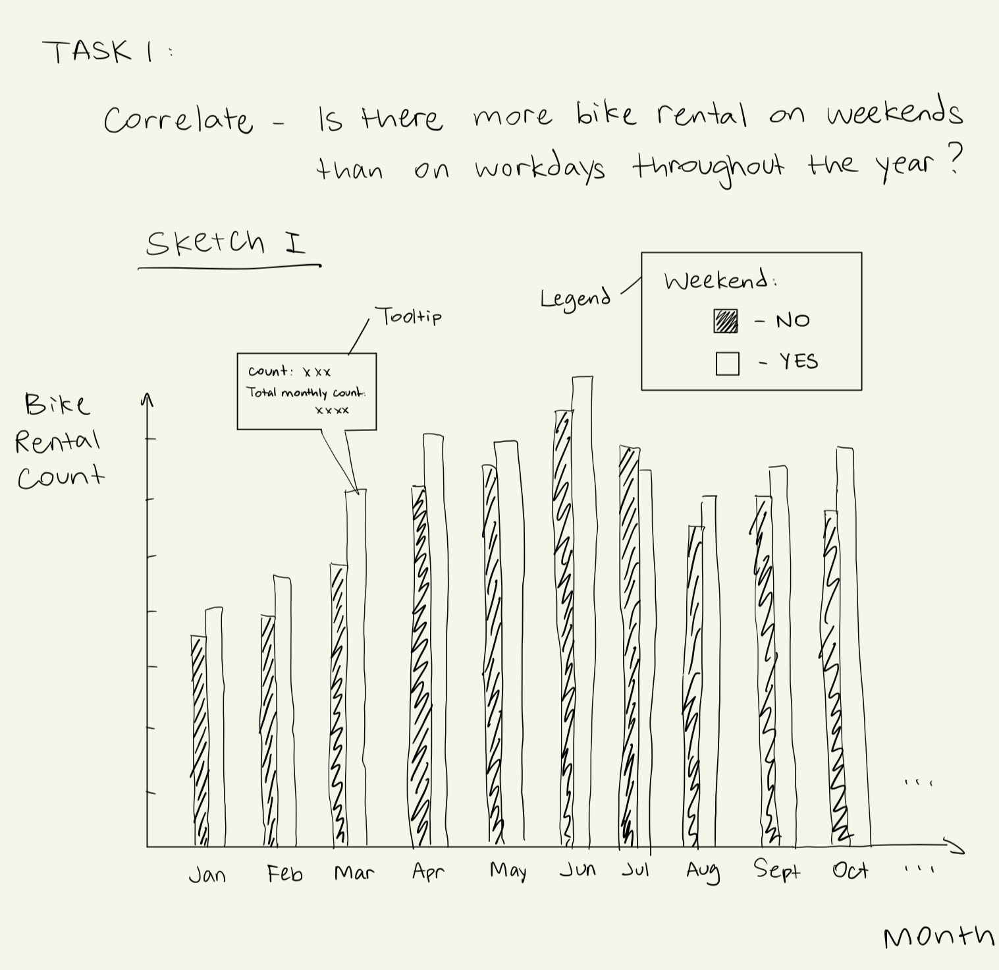

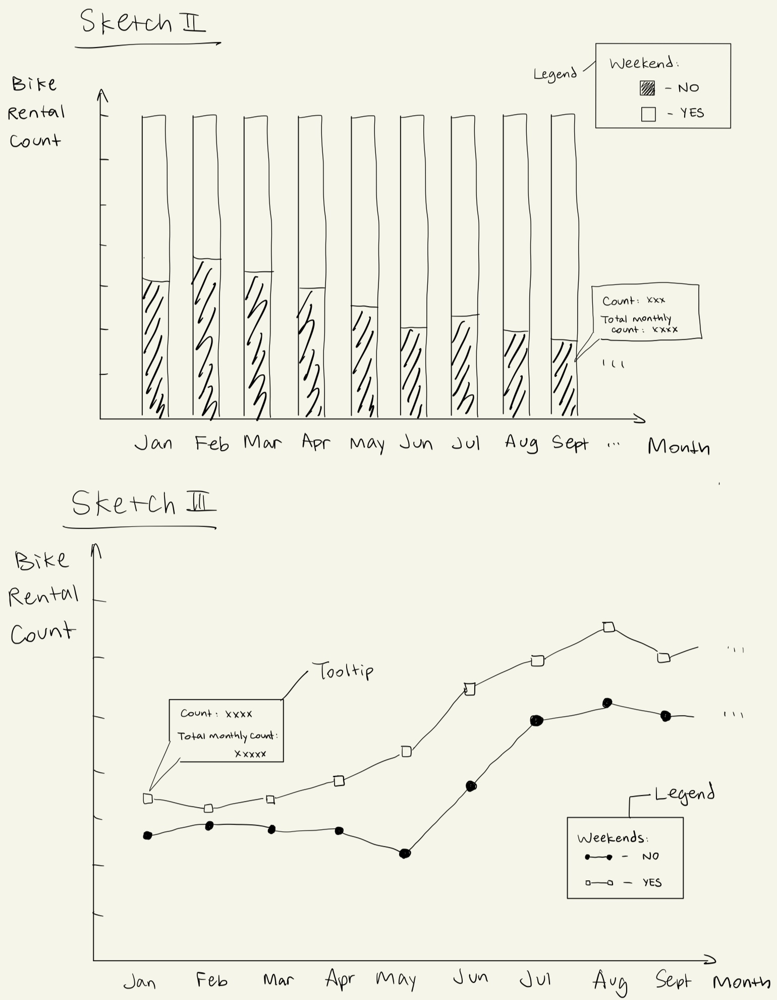

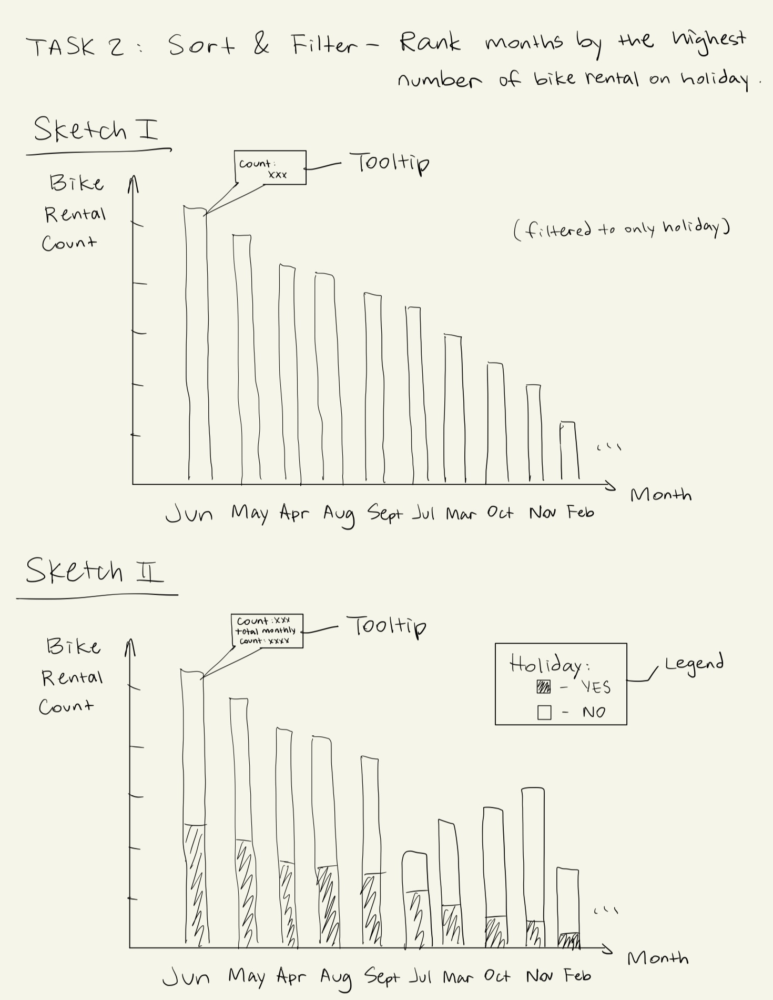

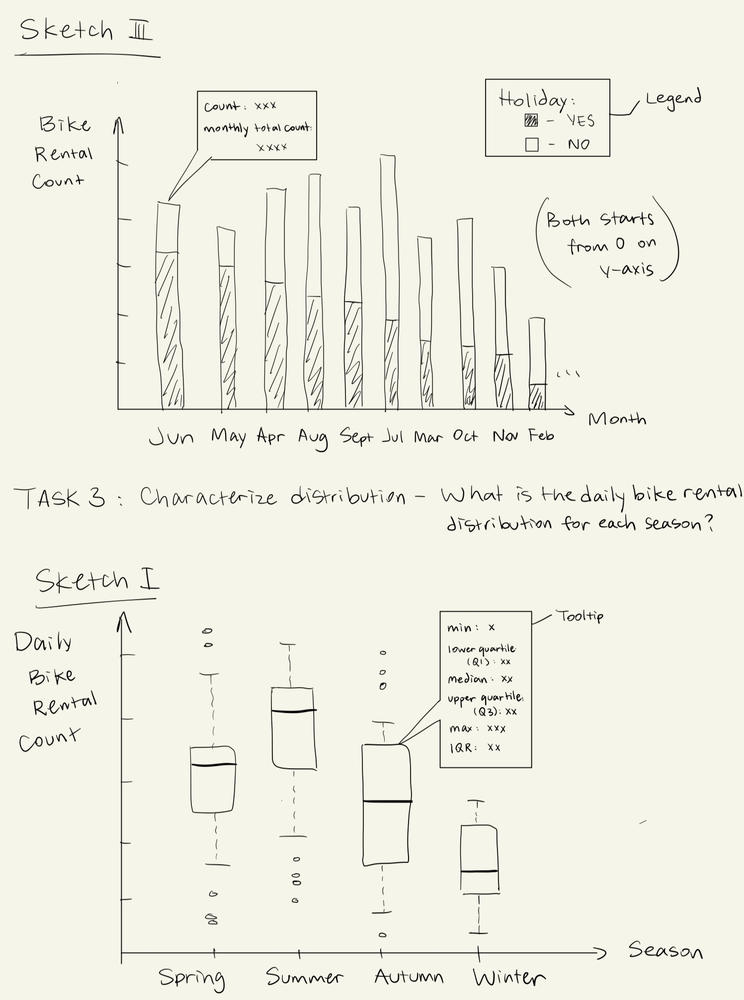

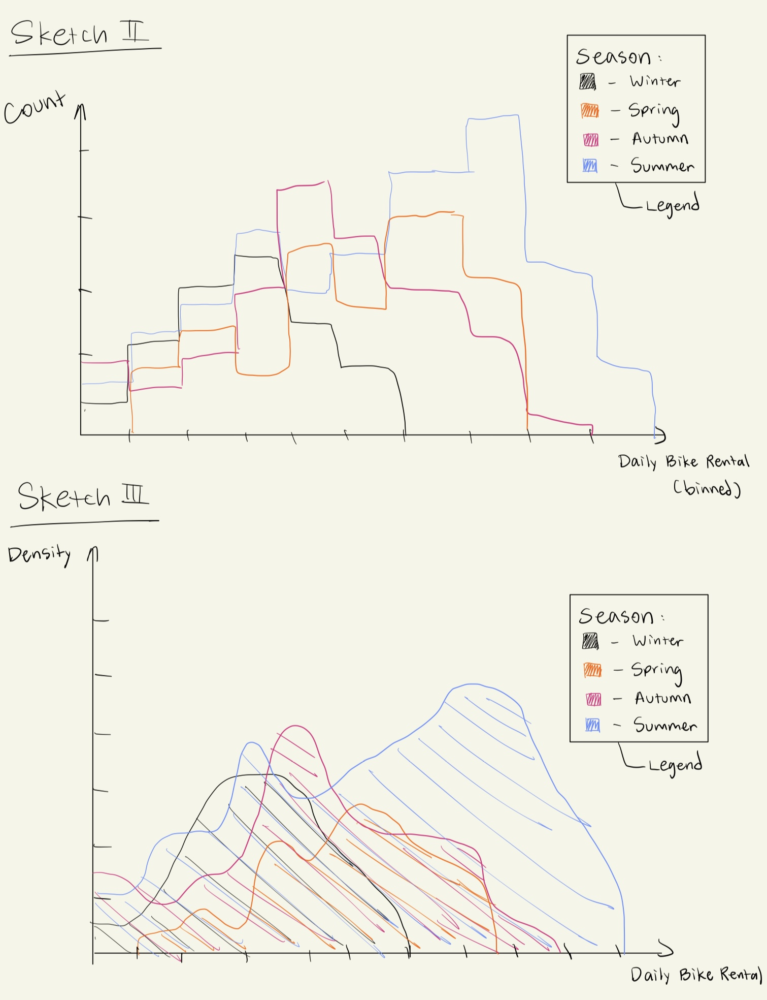

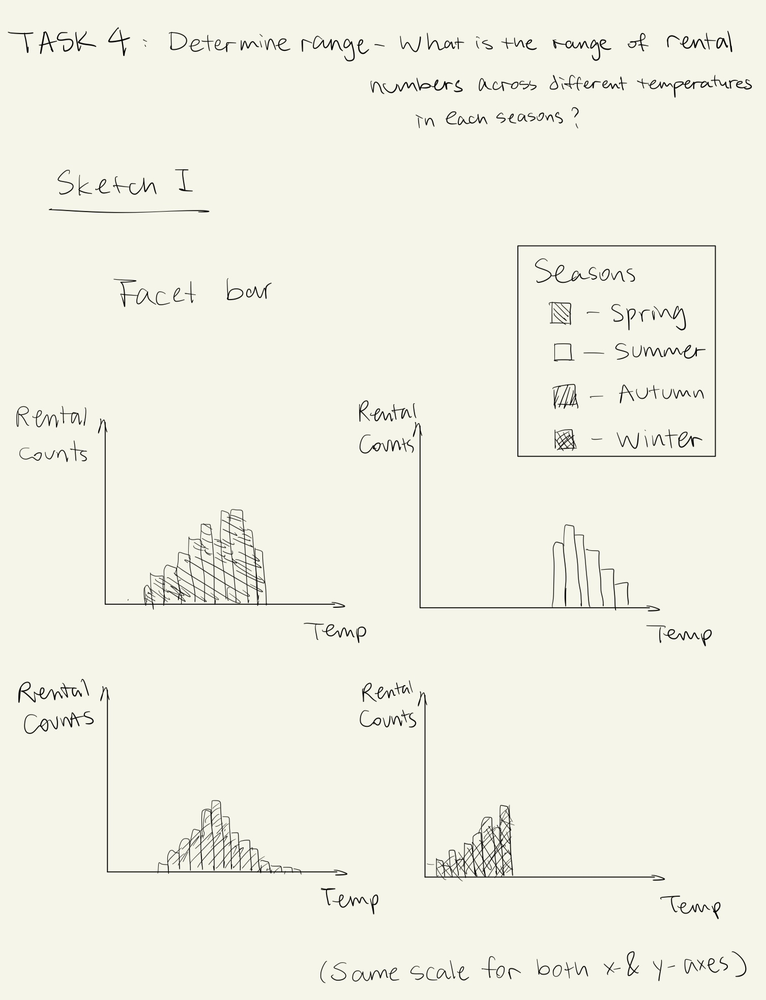

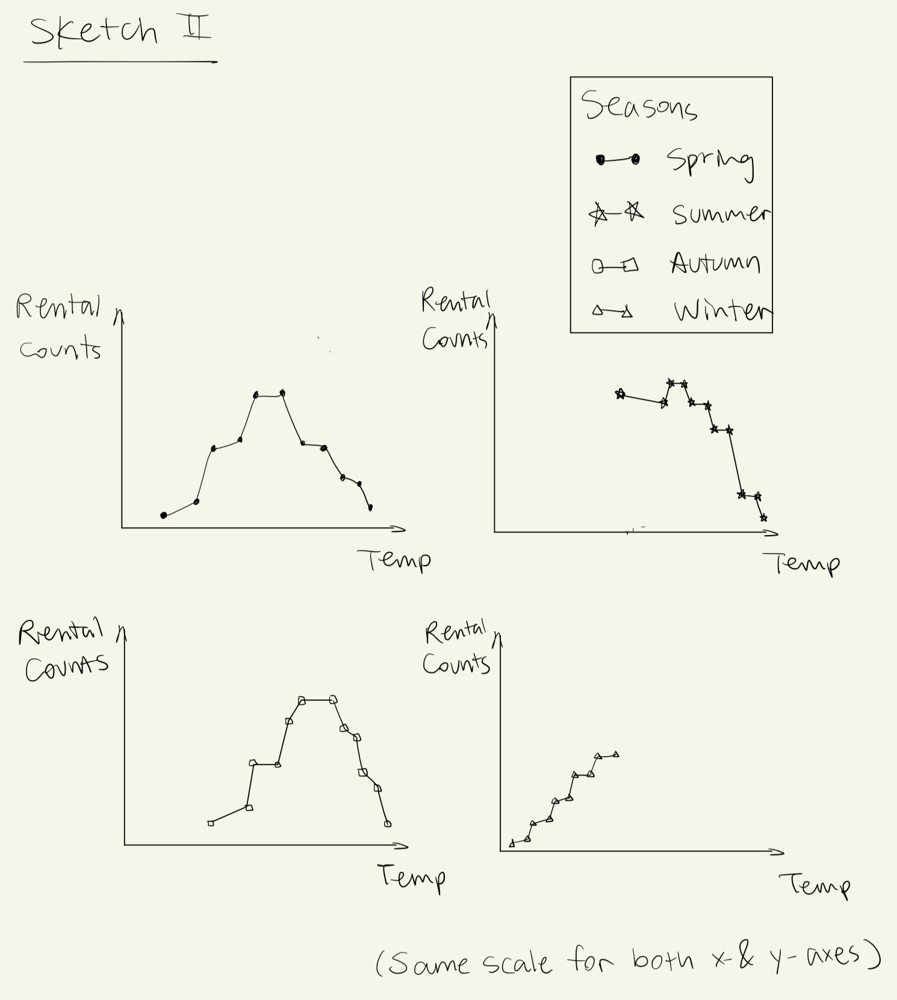

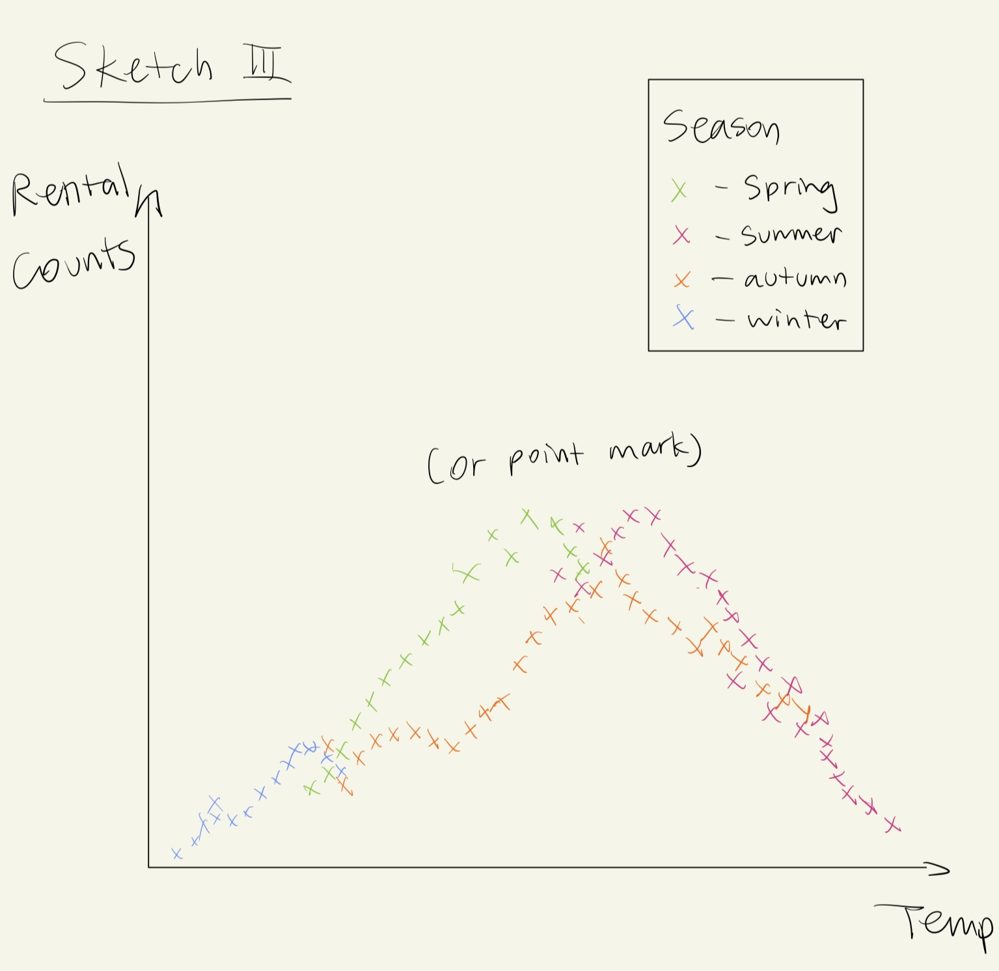

### Kevin's overview chart

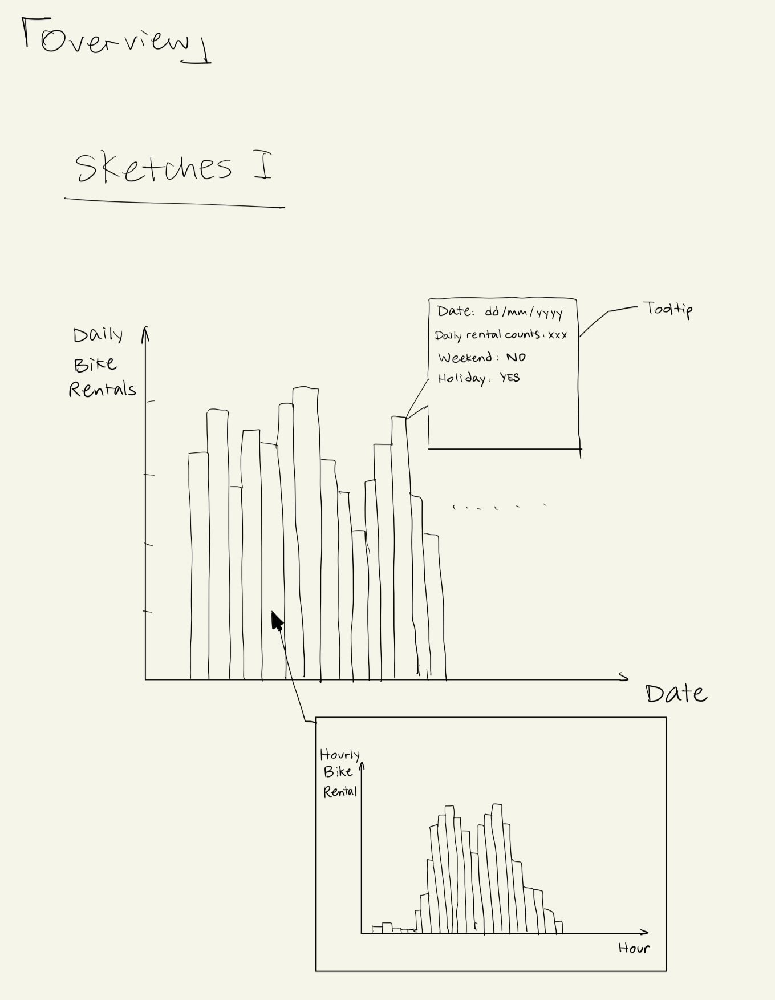

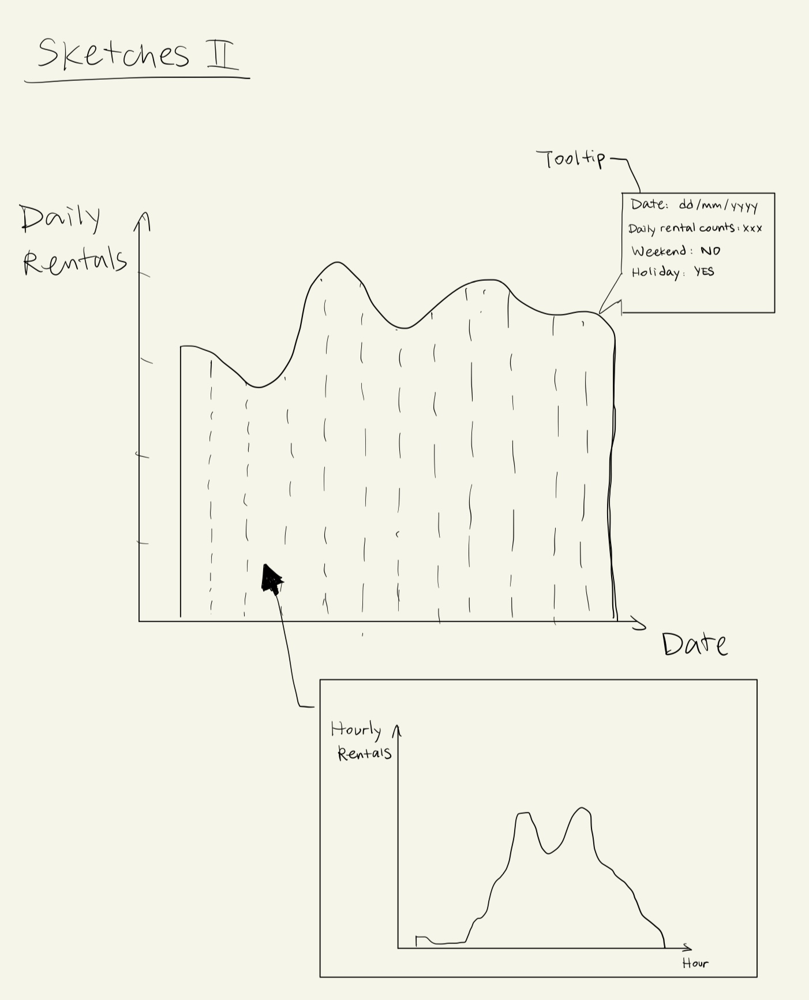